In [378]:
import matplotlib.pyplot as plt
%matplotlib inline
import os
import numpy as np
from skimage.exposure import equalize_adapthist
from skimage.transform import resize
from skimage.color import rgb2ycbcr
from scipy.misc import imsave
import cv2
import glob

# Few helper functions
def show_images(images,titles=None, save=None):
    """Display a list of images"""
    n_ims = len(images)
    if titles is None: titles = ['(%d)' % i for i in range(1,n_ims + 1)]
    fig = plt.figure()
    n = 1
    for image,title in zip(images,titles):
        a = fig.add_subplot(1,n_ims,n) # Make subplot
        if len(image.shape) == 2 or image.shape[2] == 1: # Is image grayscale?
            plt.imshow(np.resize(image, (image.shape[0], image.shape[1])), interpolation="bicubic", cmap="gray") # Only place in this blog you can't replace 'gray' with 'grey'
        else:
            plt.imshow(image, interpolation="bicubic")
        if titles is not None:
            a.set_title(title)
        n += 1
    fig.set_size_inches(np.array(fig.get_size_inches()) * n_ims)
    plt.tight_layout()
    plt.show()
    if save is not None:
        fig.savefig("examples/" + save + ".png")
        

def extract_frames(clip, times, imgdir, imgname):
    for t in times:
        imgpath = os.path.join(imgdir, '{}-{}.jpg'.format(imgname, t))
        clip.save_frame(imgpath, t)
        
def draw_corners(img_fname, nx=9, ny=6):
    img = cv2.imread(img_fname)

    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
    
    # If found, draw corners
    if ret == True:
        # Draw and display the corners
        return ret, corners, cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
    else:
        return ret, corners, None

def output_image(img, img_name, prefix="examples"):
    imsave(str(prefix) + "/" + str(img_name) + ".png", img)

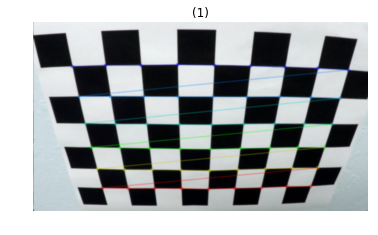

In [2]:
show_images([draw_corners("camera_cal/calibration2.jpg")[2]])

In [3]:
def get_calibrated(images, nx=9, ny=6):
    objpoints = []  # 3D points in the real world
    imgpoints = []  # 2D points in the images
    
    # Prepare object points for known corners
    objp = np.zeros((nx*ny, 3), np.float32)
    objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1, 2)  # x, y coordinates
    
    for img in images:
        ret, corners, img_corners = draw_corners(img, nx=nx, ny=ny)
        
        if ret == True:
            objpoints.append(objp)
            imgpoints.append(corners)
            
    img = cv2.imread(images[0])
    return cv2.calibrateCamera(objpoints, imgpoints, img.shape[1::-1], None, None)

images = glob.glob("camera_cal/calibration*.jpg")

# Leave 1st image as test image.
ret, mtx, dist, _, _ = get_calibrated(images[1:])

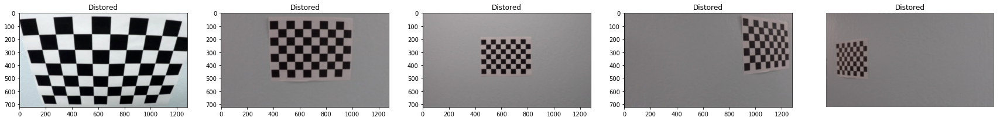

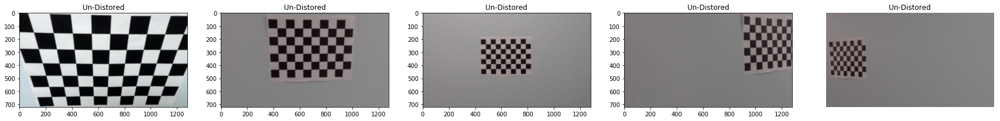

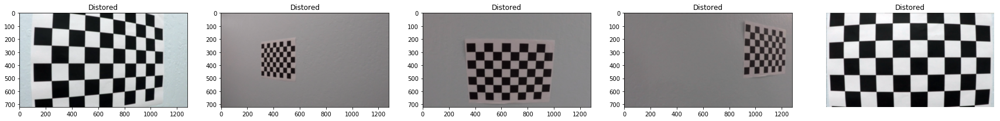

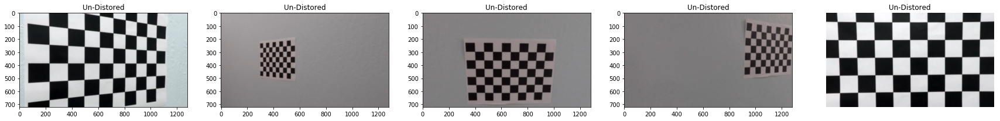

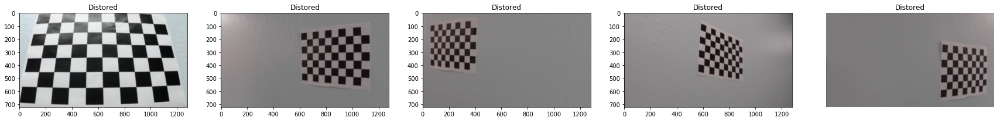

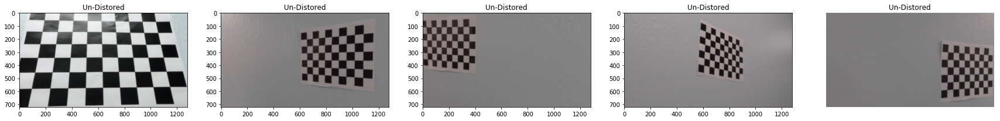

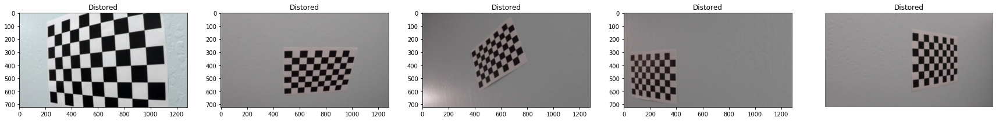

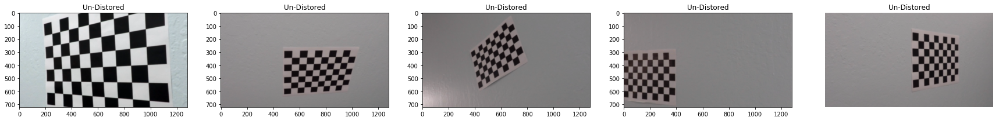

In [4]:
images_undist = [ cv2.undistort(cv2.imread(x), mtx, dist, None, mtx) for x in images ]


for i in range(0, 4):
    show_images([cv2.imread(x) for x in images[i*5:i*5+6]], ["Distored"]*5)
    show_images(images_undist[i*5:i*5+6], ["Un-Distored"]*5)

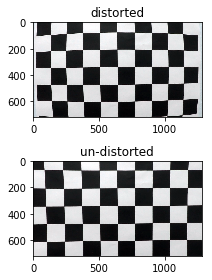

In [373]:
def plot_dist_undist(dist, undist,save_name):
    fig, (ax1, ax2) = plt.subplots(2, 1)
    ax1.imshow(dist)
    ax1.set_title("distorted")
    ax2.imshow(undist)
    ax2.set_title("un-distorted")
    plt.tight_layout()
    plt.draw()
    fig.savefig("examples/" + save_name + ".png")
    
plot_dist_undist(cv2.imread(images[9]), images_undist[9], "camera_dist")

In [5]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

def extract_images(video_fname, times, imgdir, imgname):
    clip1 = VideoFileClip(video_fname)
    extract_frames(clip1, times, imgdir, imgname)

In [110]:
# Extract images from videos

extract_images("project_video.mp4", [49.0, 50.0], "test_images", "project_video")
extract_images("challenge_video.mp4", [1.0, 2.0, 3.0, 3.5, 4.3, 4.4, 4.6, 4.8, 5.0], "test_images", "challenge_video")
extract_images("harder_challenge_video.mp4", [3.0, 4.0], "test_images", "harder_challenge_video")

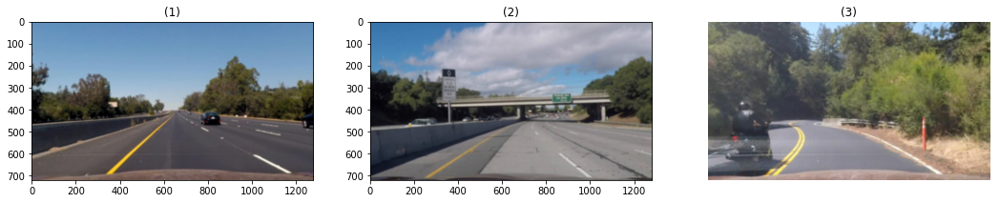

In [111]:
# undistort test images

test_imgs = ["test_images/project_video-50.0.jpg", "test_images/challenge_video-2.0.jpg", "test_images/harder_challenge_video-3.0.jpg"]
undist_test_imgs = [cv2.cvtColor(cv2.undistort(cv2.imread(x,  cv2.IMREAD_COLOR), mtx, dist, None, mtx), cv2.COLOR_BGR2RGB) for x in test_imgs]
show_images(undist_test_imgs)

(720, 1280, 3)


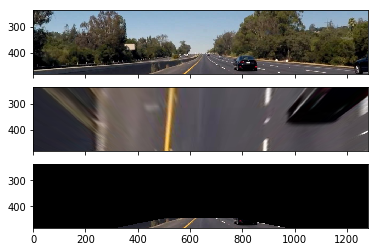

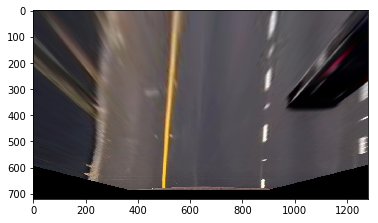

In [112]:
# Prespective transform
bottom_left = (290, 673)
bottom_right = (1024, 673)
top_right = (757,496)
top_left = (531, 496)

src = np.float32([[bottom_left, bottom_right, top_right, top_left]])
dst = np.float32([[(460, 673), (820, 673), (820, 496), (460, 496)]])

M = cv2.getPerspectiveTransform(src, dst)
Minv = cv2.getPerspectiveTransform(dst, src)
img = undist_test_imgs[0]
print(img.shape)

def warp(img):
    return cv2.warpPerspective(img, M, (img.shape[1], img.shape[0]), flags=cv2.INTER_LINEAR)
    
def unwarp(img):
    return cv2.warpPerspective(img, Minv, (img.shape[1], img.shape[0]), flags=cv2.INTER_LINEAR)

warped = warp(img)
inv_warped = unwarp(warped)

f, (ax1, ax2, ax3) = plt.subplots(3, sharex=True)
ax1.imshow(img)
ax2.imshow(warped)
ax3.imshow(inv_warped)
plt.show()

f, ax = plt.subplots(1)
ax.imshow(warped)
plt.show()

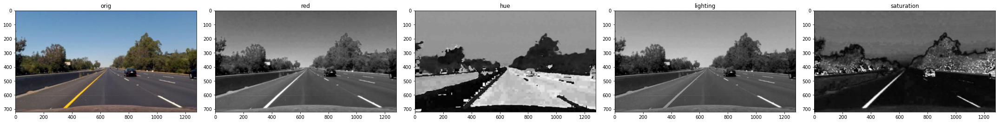

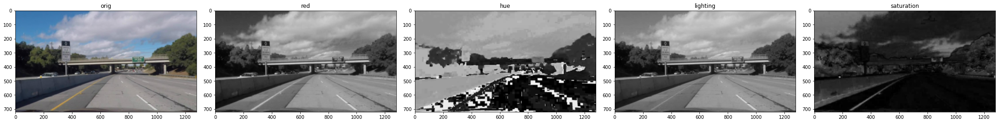

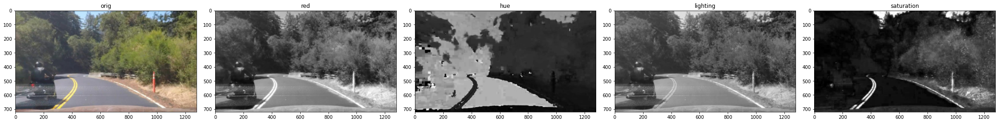

In [380]:
# Thresholding
def get_hls(img_rgb):
    return cv2.split(cv2.cvtColor(img_rgb, cv2.COLOR_RGB2HLS))

def get_rgb(img_rgb):
    return cv2.split(img_rgb)
    
def show_spaces(img, save=None):
    h, l, s = get_hls(img)
    img_list = [img, get_rgb(img)[0], h, l, s]
    name_list = ["orig", "red", "hue", "lighting", "saturation"]
    show_images(img_list, name_list, save=save)

show_spaces(img, save="color_split")
show_spaces(undist_test_imgs[1])
show_spaces(undist_test_imgs[2])

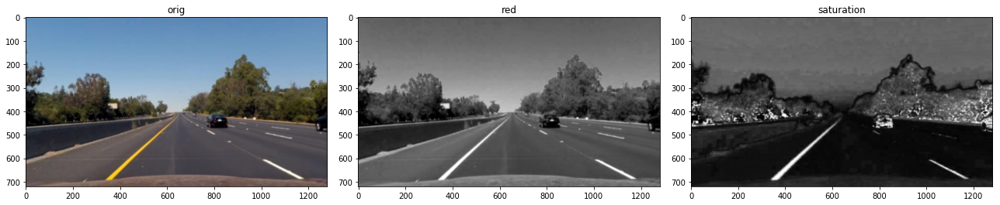

In [381]:
def show_spaces(img, save=None):
    h, l, s = get_hls(img)
    img_list = [img, get_rgb(img)[0], s]
    name_list = ["orig", "red", "saturation"]
    show_images(img_list, name_list, save=save)

show_spaces(img, save="color_split")

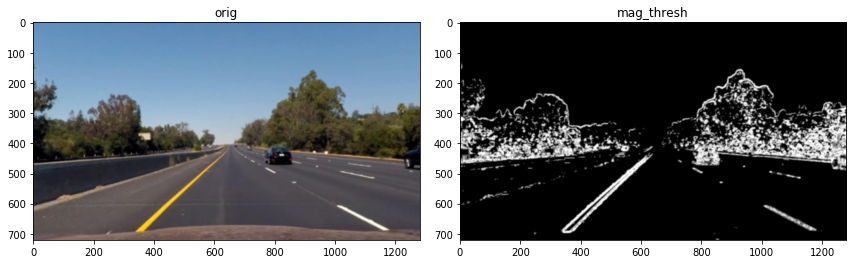

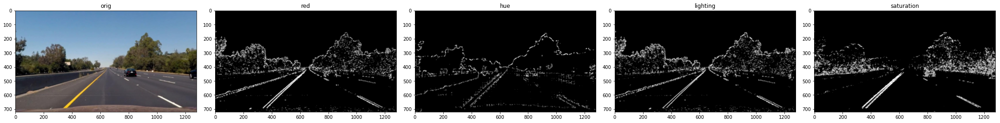

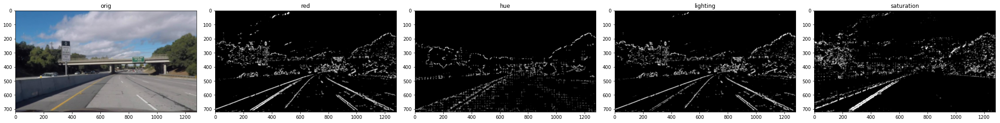

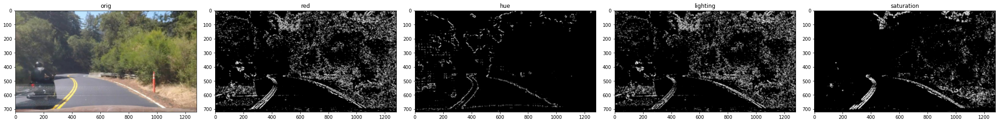

In [383]:
clahe = cv2.createCLAHE()
def _rbg_CLAHE(img):
    img_lab = cv2.cvtColor(img, cv2.COLOR_RGB2Lab)
    l,a,b = cv2.split(img_lab)
    l_clahe =  clahe.apply(l)
    return cv2.cvtColor(cv2.merge((l_clahe, a, b)), cv2.COLOR_Lab2RGB)

def abs_sobel_thresh(img, orient='x', sobel_kernel=5, thresh=(0, 255), is_gray=True):
    if is_gray:
        gray = img
    else:
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    if orient == 'x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    else:
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    abs_sobel = np.absolute(sobel)
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    sbinary = np.zeros_like(scaled_sobel)
    sbinary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    return sbinary

def dir_threshold(img, sobel_kernel=5, thresh=(0, np.pi/2), is_gray=True):
    # Grayscale
    if is_gray:
        gray = img
    else:
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output = np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1
    return binary_output

def mag_thresh(img, sobel_kernel=5, mag_thresh=(0, 255), is_gray=True):
    # Apply the following steps to img
    # 1) Convert to grayscale
    if is_gray:
        gray = img
    else:
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1
    return binary_output

def combine_thresh(image, ksize=5, is_gray=True):
    # Apply each of the thresholding functions
    gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=ksize, thresh=(20, 150), is_gray=is_gray)
    grady = abs_sobel_thresh(image, orient='y', sobel_kernel=ksize, thresh=(20, 150), is_gray=is_gray)
    mag_binary = mag_thresh(image, sobel_kernel=ksize, mag_thresh=(20, 150), is_gray=is_gray)
    dir_binary = dir_threshold(image, sobel_kernel=ksize*3, thresh=(0.7, 1.3), is_gray=is_gray)
    
    combined = np.zeros_like(dir_binary)
    combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    return combined, gradx, grady, mag_binary, dir_binary 

def show_thresh(img, apply_clahe=False):
    if apply_clahe:
        clahe = _rbg_CLAHE(img)
    else:
        clahe = img
    r, g, b = get_rgb(clahe)
    h, l, s = get_hls(clahe)
    show_images([img, combine_thresh(r)[0], combine_thresh(h)[0], combine_thresh(l)[0], combine_thresh(s)[0]], ["orig", "red", "hue", "lighting", "saturation"])

show_images([img, mag_thresh(get_hls(img)[2], sobel_kernel=5, mag_thresh=(20, 150))], ["orig", "mag_thresh"])
show_thresh(img)
show_thresh(undist_test_imgs[1])
show_thresh(undist_test_imgs[2])

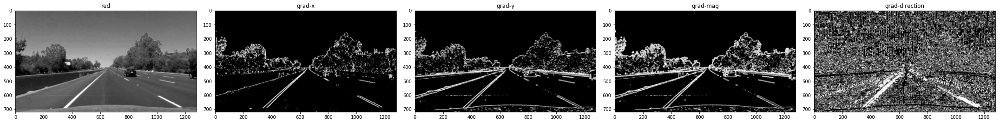

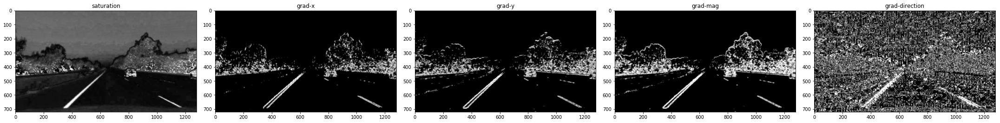

In [387]:
r_img = get_rgb(img)[0]
l = [r_img]
l.extend(combine_thresh(r_img)[1:])
show_images(l, ["red", "grad-x", "grad-y", "grad-mag", "grad-direction"], save="red_grads")

s_img = get_hls(img)[2]
l = [s_img]
l.extend(combine_thresh(s_img)[1:])
show_images(l, ["saturation", "grad-x", "grad-y", "grad-mag", "grad-direction"], save="sat_grads")

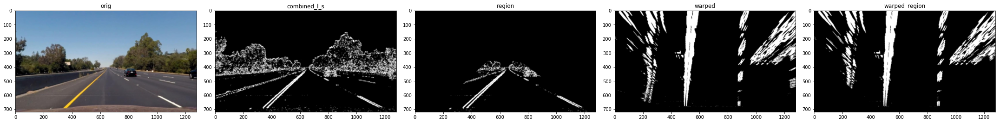

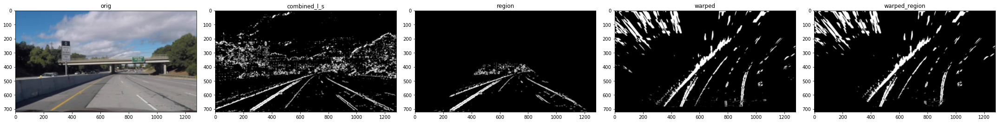

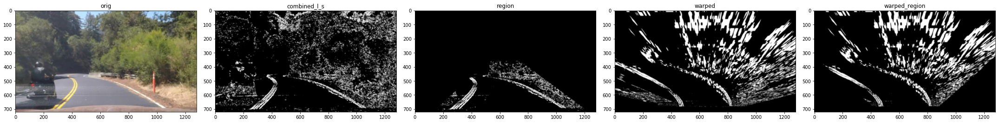

In [395]:
def combine_rs(img, apply_clahe=False):
    """
    Expects a color image.
    """
    if apply_clahe:
        clahe = _rbg_CLAHE(img)
    else:
        clahe = img
    r, g, b = get_rgb(clahe)
    h, l, s = get_hls(clahe)
    combined = np.zeros_like(h)
    r_t = combine_thresh(r)[0]
    s_t = combine_thresh(s)[0]
    combined[((r_t == 1) | (s_t == 1))] = 1
    return combined

def region_of_interest(img, vertices, mask_color = 255):
    #defining a blank mask to start with
    if mask_color == 255:
        mask = np.zeros_like(img)
    else:
        mask = np.copy(img)

    ignore_mask_color = mask_color
        
    # filling pixels inside the polygon defined by "vertices" with the fill color    
    p = cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    # returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, p)
    return masked_image

def lane_region_mask(image):
    # copy the given arg so we do not mess with it.
    # Grab the x and y size and make a copy of the image
    lratio = 0.10
    rratio = 0.04
    ysize = image.shape[0]
    xsize = image.shape[1]

    # Mask the region of interest
    region_array = np.array([[(int(xsize*lratio), image.shape[0]-0), 
                              (int(xsize*(1.0-rratio)), image.shape[0]-0), 
                              ((xsize/2)*(1 + rratio*4), int(ysize*0.50)), 
                              ((xsize/2)*(1 - lratio*2), int(ysize*0.50))]], 
                            dtype=np.int32)
    
    

    region_array2 = np.array([[(int(xsize*lratio*3), image.shape[0]-0), 
                              (int(xsize*(1.0-rratio*3.5)), image.shape[0]-0), 
                              ((xsize/2)*(1 + rratio*4), int(ysize*0.80)), 
                              ((xsize/2)*(1 - lratio*1), int(ysize*0.80))]], 
                            dtype=np.int32)
    

    return region_of_interest(region_of_interest(image, region_array), region_array2, mask_color = 0)

def warp_region(img, ignore_region=False):
    # Mask the region of interest and feed through hough.
    if ignore_region:
        return warp(img)
    else:
        return warp(lane_region_mask(img))
    
def show_combine_rs(img, apply_clahe=False):
    c = combine_rs(img, apply_clahe=apply_clahe)
    show_images([img, c, lane_region_mask(c), warp(c), warp_region(c)], ["orig", "combined_l_s", "region", "warped", "warped_region"]) 

show_combine_rs(img)
show_combine_rs(undist_test_imgs[1])
show_combine_rs(undist_test_imgs[2])
#show_combine_ls(undist_test_imgs[3])

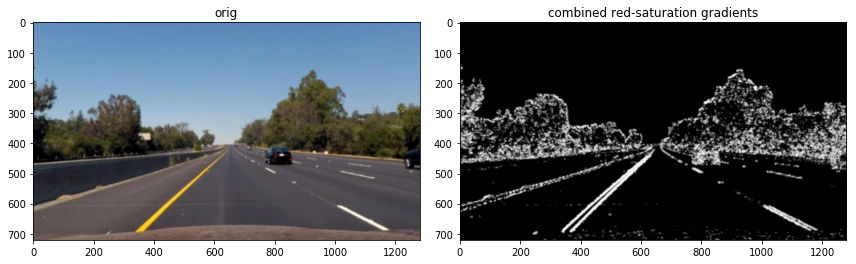

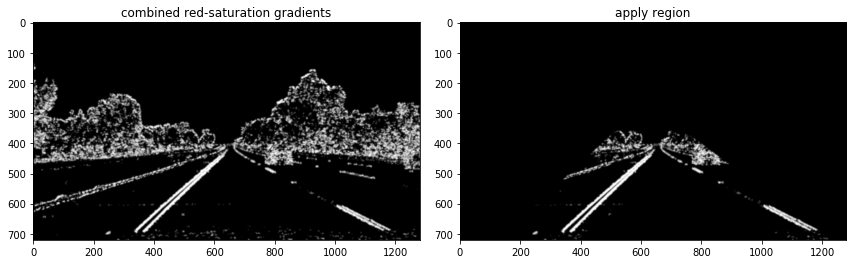

In [396]:
crs = combine_rs(img)
show_images([img, crs], ["orig", "combined red-saturation gradients"], save="comb_rs_grads")

crs_region = lane_region_mask(crs)
show_images([crs, crs_region], ["combined red-saturation gradients", "apply region"], save="comb_rs_grads_region")


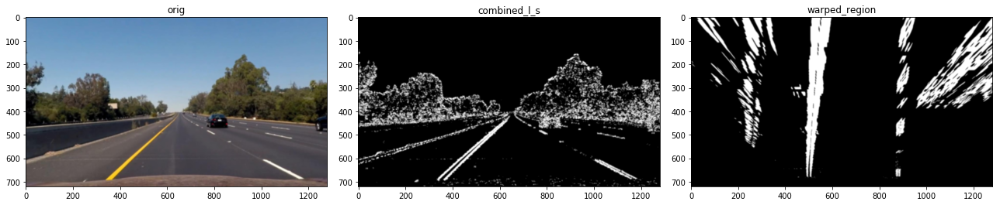

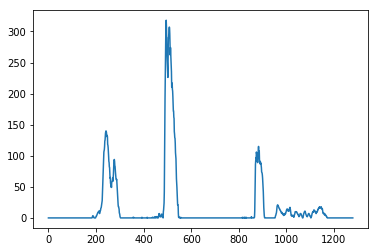

(720, 1280)
left conf: [  3.17631262e-06   2.00390716e-03   2.60278362e-01] right conf: [  3.44994374e-06   2.13088344e-03   2.60909075e-01]


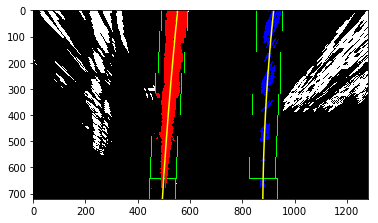

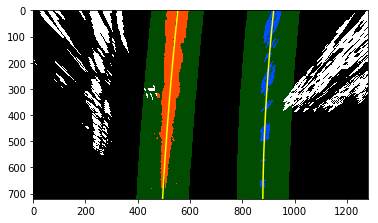

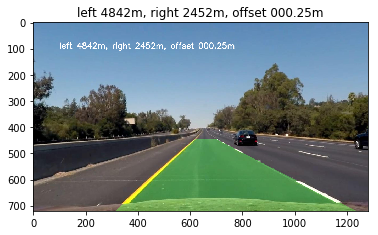

In [415]:
from matplotlib.backends.backend_agg import FigureCanvasAgg as FigureCanvas

def get_curvature(leftx, lefty, rightx, righty):
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*np.max(lefty)*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*np.max(righty)*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    # Now our radius of curvature is in meters
    return left_curverad, right_curverad

def get_center_offset(left_fit, right_fit, ymax=720.0, xmax=1280.0):
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    left = left_fit[0]*ymax**2 + left_fit[1]*ymax + left_fit[2]
    right = right_fit[0]*ymax**2 + right_fit[1]*ymax + right_fit[2]
    
    return ((left + (right - left) / 2) - xmax/2)*xm_per_pix

# Sliding window
def sliding_window(binary_warped, window_img_out=False):
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[int(binary_warped.shape[0]//2):,:], axis=0)
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 50
    # Set minimum number of pixels found to recenter window
    minpix = 35
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    if window_img_out:
        out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    else:
        out_img = None
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        if window_img_out:
            cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high), (0,255,0), 2) 
            cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high), (0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
                          (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
                           (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit, left_cov = np.polyfit(lefty, leftx, 2, cov=True)
    right_fit, right_cov = np.polyfit(righty, rightx, 2, cov=True)
    
    left_curverad, right_curverad = get_curvature(leftx, lefty, rightx, righty)
    center_offset = get_center_offset(left_fit, right_fit)
    
    return out_img, left_fit, right_fit, np.sqrt(np.diag(left_cov)), np.sqrt(np.diag(right_cov)), left_curverad, right_curverad, center_offset, left_lane_inds, right_lane_inds, nonzerox, nonzeroy
    

def visualize_silding_window(binary_warped, out_img, left_fit, right_fit, left_lane_inds, right_lane_inds, nonzerox, nonzeroy):
    # Generate x and y values for plotting
    # Create an output image to draw on and  visualize the result
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    f, ax = plt.subplots()
    ax.imshow(out_img)
    ax.plot(left_fitx, ploty, color='yellow')
    ax.plot(right_fitx, ploty, color='yellow')
    ax.set_xlim(0, 1280)
    ax.set_ylim(720, 0)
    plt.show()
  
def find_lanes_with_hint(binary_warped, left_fit, right_fit):
    # Assume you now have a new warped binary image 
    # from the next frame of video (also called "binary_warped")
    # It's now much easier to find line pixels!
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 50
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
    left_fit[1]*nonzeroy + left_fit[2] + margin))) 

    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
    right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    # Fit a second order polynomial to each
    if lefty.size == 0 or righty.size == 0:
        return [None]*10
    
    left_fit, left_cov = np.polyfit(lefty, leftx, 2, cov=True)
    right_fit, right_cov = np.polyfit(righty, rightx, 2, cov=True)

    left_curverad, right_curverad = get_curvature(leftx, lefty, rightx, righty)
    center_offset = get_center_offset(left_fit, right_fit)

    return left_fit, right_fit, np.sqrt(np.diag(left_cov)), np.sqrt(np.diag(right_cov)), left_curverad, right_curverad, center_offset, left_lane_inds, right_lane_inds, nonzerox, nonzeroy
    
def visualize_lanes(binary_warped, left_fit, right_fit, left_lane_inds, right_lane_inds, nonzerox, nonzeroy):
    margin = 100
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))

    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    return result, left_fitx, right_fitx, ploty

def draw_visualize_lanes(binary_warped, left_fit, right_fit, left_lane_inds, right_lane_inds, nonzerox, nonzeroy):
    result, left_fitx, right_fitx, ploty = visualize_lanes(binary_warped, left_fit, right_fit, left_lane_inds, right_lane_inds, nonzerox, nonzeroy)
    f, ax = plt.subplots()
    canvas = FigureCanvas(f)
    ax.imshow(result)
    ax.plot(left_fitx, ploty, color='yellow')
    ax.plot(right_fitx, ploty, color='yellow')
    ax.set_xlim(0, 1280)
    ax.set_ylim(720, 0)
    plt.show()

def draw_on_orig(undist, warped, left_fit, right_fit, text=None):
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Generate x and y values for plotting
    ploty = np.linspace(0, warped.shape[0]-1, warped.shape[0])
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (undist.shape[1], undist.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
    if text is not None:
        font = cv2.FONT_HERSHEY_SIMPLEX
        cv2.putText(result,text,(100,100), font, 1,(255,255,255),2,cv2.LINE_AA)
    return result
    
def show_draw_on_orig(undist, warped, left_fit, right_fit, text=None):
    result = draw_on_orig(undist, warped, left_fit, right_fit, text=text)
    f, ax = plt.subplots()
    ax.imshow(result)
    ax.set_title(text)
    plt.show()

def show_sliding_window(img, apply_clahe=False):
    c = combine_ls(img, apply_clahe=apply_clahe)
    warped = warp_region(c)
    show_images([img, c, warped], ["orig", "combined_l_s", "warped_region", "sliding_window"])
    f, ax = plt.subplots(1)
    histogram = np.sum(warped[int(img.shape[0]/2):,:], axis=0)
    ax.plot(histogram)
    plt.show()
    print(warped.shape)
    out_img, left_fit, right_fit, left_conf, right_conf, left_curverad, right_curverad, center_offset, left_lane_inds, right_lane_inds, nonzerox, nonzeroy = sliding_window(warped, window_img_out=True)
    print("left conf: {} right conf: {}".format(left_conf, right_conf))
    visualize_silding_window(warped, out_img, left_fit, right_fit, left_lane_inds, right_lane_inds, nonzerox, nonzeroy)
    
    # find lane with hints, use the same img to make sure it is working
    left_fit, right_fit, left_conf, right_conf, left_curverad, right_curverad, center_offset, left_lane_inds, right_lane_inds, nonzerox, nonzeroy = find_lanes_with_hint(warped, left_fit, right_fit)
    draw_visualize_lanes(warped, left_fit, right_fit, left_lane_inds, right_lane_inds, nonzerox, nonzeroy)
    
    text = "left {}m, right {}m, offset {:06.2f}m".format(int(left_curverad), int(right_curverad), center_offset)
    show_draw_on_orig(img, warped, left_fit, right_fit, text=text)
    
show_sliding_window(img)


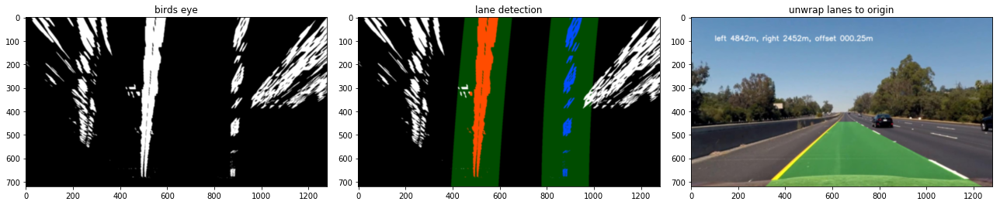

In [419]:
warped = warp(crs_region)
out_img, left_fit, right_fit, left_conf, right_conf, left_curverad, right_curverad, center_offset, left_lane_inds, right_lane_inds, nonzerox, nonzeroy = sliding_window(warped, window_img_out=True)
left_fit, right_fit, left_conf, right_conf, left_curverad, right_curverad, center_offset, left_lane_inds, right_lane_inds, nonzerox, nonzeroy = find_lanes_with_hint(warped, left_fit, right_fit)
warped_lanes = visualize_lanes(warped, left_fit, right_fit, left_lane_inds, right_lane_inds, nonzerox, nonzeroy)[0]
text = "left {}m, right {}m, offset {:06.2f}m".format(int(left_curverad), int(right_curverad), center_offset)
orig_lanes = draw_on_orig(img, warped, left_fit, right_fit, text=text)

show_images([warped, warped_lanes, orig_lanes], ["birds eye", "lane detection", "unwrap lanes to origin"], save="bird_to_undist")


In [420]:
from collections import deque

class Line():
    def __init__(self, max_len=15, max_miss=13, name=None):
        self.max_len = int(max_len)
        self.max_miss = int(max_miss)
        self.name = name
        self.miss_count = 0
        self.line_q = deque()
        self.line_sum = None

    def is_valid(self):
        return len(self.line_q) > 0

    def get_line(self):
        if len(self.line_q) == 0:
            return None
        else:
            #print ("get_line[{}]: {}".format(self.name, self.line_sum / len(self.line_q)))
            return self.line_sum / len(self.line_q)
        
    def add_fit(self, line_fit):
        self.line_q.append(line_fit)
        if self.line_sum is None:
            self.line_sum = np.copy(line_fit)
        else:
            self.line_sum += line_fit
        self.miss_count = 0
        if len(self.line_q) > self.max_len:
            self._pop_line()
    
    def add_unfit(self, line_fit):
        self.miss_count += 1
        if self.miss_count >= self.max_miss:
            self._reset()
            
    def _reset(self):
        self.line_q.clear()
        self.line_sum = None
        self.miss_count = 0

    def _pop_line(self):
        e = self.line_q.popleft()
        #print ("pop_line[{}]: sum {}, e {}".format(self.name, self.line_sum, e))
        self.line_sum -= e    
            
class Lanes():
    def __init__(self, max_len=15, err_thresh=0.95):
        self.max_len = int(max_len)
        self.err_thresh = float(err_thresh)
        self.left_fit = Line(max_len=max_len, name="left")
        self.right_fit = Line(max_len=max_len, name="right")
        self.left_curv = Line(max_len=max_len, name="lcurv")
        self.right_curv = Line(max_len=max_len, name="rcurv")
        
    def is_valid(self):
        return self.left_fit.is_valid()

    def reset(self):
        self.left_fit._reset()
        self.right_fit._reset()
        self.left_curv._reset()
        self.right_curv._reset()

    def get_left_fit(self):
        return self.left_fit.get_line()
    
    def get_right_fit(self):
        return self.right_fit.get_line()
    
    def get_left_curv(self):
        return self.left_curv.get_line()
    
    def get_right_curv(self):
        return self.right_curv.get_line()
    
    def set_fit(self, left_fit, right_fit, left_curv, right_curv, left_err, right_err):
        # print("left err: {}, right err: {}".format(left_err, right_err))
        if np.all(left_err < self.err_thresh) and np.all(right_err < self.err_thresh):
            self.left_fit.add_fit(left_fit)
            self.right_fit.add_fit(right_fit)
            self.left_curv.add_fit(left_curv)
            self.right_curv.add_fit(right_curv)
        else:
            # print("left err: {}, right err: {}".format(left_err < self.err_thresh, right_err < self.err_thresh))
            self.left_fit.add_unfit(left_fit)
            self.right_fit.add_unfit(right_fit)
            self.left_curv.add_unfit(left_curv)
            self.right_curv.add_unfit(right_curv)   

In [421]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

def pipeline(img, mtx, dist, M, Minv, lanes_obj=None, apply_clahe=False):
    """
    Undistort the image, threshold and apply prespective transform, find lanes, 
    then apply lane pixels to the image, re-distort the image and return it.
    """
    
    # Undistort the image
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    
    # Threshold application
    c = combine_rs(img, apply_clahe=apply_clahe)
    
    # Prespective transform and apply region of interest.
    warped = warp_region(c)
    
    # Apply sliding window to find lane lines
    # TODO: Optimize this.
    if lanes_obj is None or lanes_obj.is_valid() is False:
        _, left_fit, right_fit, left_err, right_err, left_curverad, right_curverad, center_offset, left_lane_inds, right_lane_inds, nonzerox, nonzeroy = sliding_window(warped)
        if lanes_obj is not None:
            lanes_obj.set_fit(left_fit, right_fit, left_curverad, right_curverad, 0.0, 0.0)
    else:
        if lanes_obj.is_valid() is False:
            print("left fit is none")
            raise Exception("left fit is none")
        left_fit, right_fit, left_err, right_err, left_curverad, right_curverad, center_offset, left_lane_inds, right_lane_inds, nonzerox, nonzeroy = find_lanes_with_hint(warped, 
                                                lanes_obj.get_left_fit(), lanes_obj.get_right_fit())
        if left_fit is not None:
            lanes_obj.set_fit(left_fit, right_fit, left_curverad, right_curverad, left_err, right_err)
            if lanes_obj.is_valid() is False:
                _, left_fit, right_fit, left_err, right_err, left_curverad, right_curverad, center_offset,left_lane_inds, right_lane_inds, nonzerox, nonzeroy = sliding_window(warped)
                lanes_obj.set_fit(left_fit, right_fit, left_curverad, right_curverad, 0.0, 0.0)
        else:
            lanes_obj.reset()
            _, left_fit, right_fit, left_err, right_err, left_curverad, right_curverad, center_offset, left_lane_inds, right_lane_inds, nonzerox, nonzeroy = sliding_window(warped)
            lanes_obj.set_fit(left_fit, right_fit, left_curverad, right_curverad, 0.0, 0.0)
        
    # light up the lane pixels
    if lanes_obj.is_valid() is False:
        return undist
    else:
        center_offset = get_center_offset(lanes_obj.get_left_fit(), lanes_obj.get_right_fit())
        text = "left {}m, right {}m curvature, center offset {:06.2f}m".format(int(lanes_obj.get_left_curv()), int(lanes_obj.get_right_curv()), center_offset)
        return draw_on_orig(undist, warped, lanes_obj.get_left_fit(), lanes_obj.get_right_fit(), text=text)

In [422]:
def process_video(input_video, output_video, clip=None):
    white_output = 'output_videos/%s' % output_video
    ## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
    ## To do so add .subclip(start_second,end_second) to the end of the line below
    ## Where start_second and end_second are integer values representing the start and end of the subclip
    ## You may also uncomment the following line for a subclip of the first 5 seconds
    if clip is not None:
        clip1 = VideoFileClip('%s' % input_video).subclip(clip[0],clip[1])
    else:
        clip1 = VideoFileClip('%s' % input_video)

    lanes = Lanes()
    def process_image(img):
        return pipeline(img, mtx, dist, M, Minv, lanes_obj=lanes)
    white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
    %time white_clip.write_videofile(white_output, audio=False)
    
    return white_output

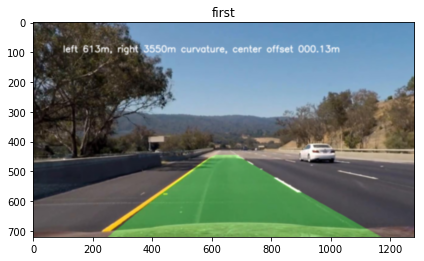

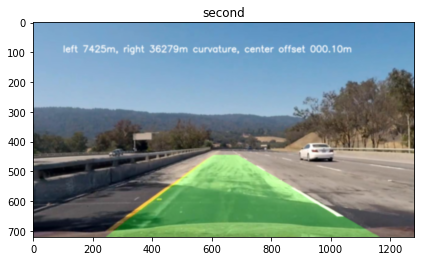

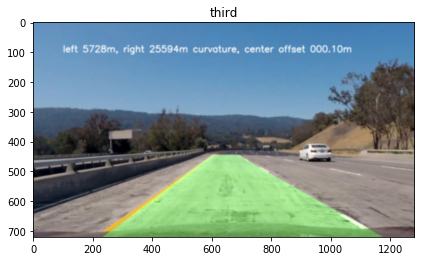

In [423]:
extract_images("project_video.mp4", [21.0, 22.0, 23.0], "test_images", "project_video")
lanes_try = Lanes()
def process_image(img):
    return pipeline(img, mtx, dist, M, Minv, lanes_obj=lanes_try)
l = ["test_images/project_video-21.0.jpg", "test_images/project_video-22.0.jpg", "test_images/project_video-23.0.jpg"]
show_images([process_image(cv2.cvtColor(cv2.imread(l[0], cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB))], ["first"])
show_images([process_image(cv2.cvtColor(cv2.imread(l[1], cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB))], ["second"])
show_images([process_image(cv2.cvtColor(cv2.imread(l[2], cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB))], ["third"])

In [424]:
white_output = process_video("project_video.mp4", "project_video.mp4")

[MoviePy] >>>> Building video output_videos/project_video.mp4
[MoviePy] Writing video output_videos/project_video.mp4


100%|█████████▉| 1260/1261 [07:27<00:00,  2.80it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_videos/project_video.mp4 

CPU times: user 11min, sys: 2min 37s, total: 13min 38s
Wall time: 7min 27s


In [425]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(white_output))